# Word embedding

In [1]:
import pandas as pd
import csv
import spacy
import numpy as np
import umap
import seaborn as sns
import string
from nltk import tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.preprocessing import StandardScaler
from string import punctuation

## stopwords
#### itt most mindet eltávolítom, mivel szavak (ngramok) szintjén vizsgálódom

In [2]:
more_trash = ['isnt',"cant","’","you","yourself","``",",","``","]","ace","one","two","three","four","five","six","seven","eight","nine","ten","page","knight",
              "queen","king","cups","wands","swords","pentacles","world","judgement","sun","moon","star","tower","devil",
              "temperance","death","hanged man","justice","wheel","fortune","hermit","strength","chariot","lovers","hierophant",
              "emperor","empress","priestess","magician","fool"]
stoplist = set(stopwords.words('english') + list(punctuation) + list(more_trash))

## tisztogatás
#### megfelelő formátumra hozás, speciális karakterek, stopwordkök eltávolítása

In [3]:
labyrinthos = pd.read_csv("RAW_DATABASE.csv")
labyrinthos["words"] = [element.split(",") for element in labyrinthos["keywords"]]
# mivel a keywords oszlop egy felsorolás, ezért "felrobbantom", hogy mindegyik külön megfigyelés legyen
# note: ezek tokenek, bigrammok és n-grammok
labyrinthos = labyrinthos.explode("words", ignore_index=True).drop("index_nun", axis=1)
# kisbetűsítem, kiszedem a stopwordöket (itt csak azokat szedi ki, amik magukban vannak (n-gramokból nem))
labyrinthos["words"] = [
    element.lower().translate(str.maketrans("", "", string.punctuation))
    if element.lower() not in stoplist
    else None
    for element in labyrinthos["words"]
]
# indexeket megigazítom mert a language modelnek fontos
labyrinthos = labyrinthos.dropna().reset_index(drop=True).reset_index()
# csinálok egy listát a keywordös oszlop elemeiből
elements = [labyrinthos["words"][i] for i in range(len(labyrinthos["words"]))]
# kiszedem a maradék speciális karaktereket is
no_punct = [
    "".join(
        [
            letter
            for letter in elements[i]
            if letter not in string.punctuation and letter != "’"
        ]
    )
    for i in range(len(elements))
]
# ez lesz az új words oszlop
labyrinthos["words"] = no_punct
# lehetnek üres értékek, ezeket kidobom
labyrinthos = labyrinthos[labyrinthos["words"]!=""]


### behívom a language modellt, amit használni fogok
#### kell a vektorozáshoz, és a POS-tagginghez is

In [18]:
nlp = spacy.load("en_core_web_md")

## lemmatizálás
#### nem szeretném, hogy a szó alakja miatt legyenek különbözőek a tokenek

In [4]:
# POS tagginget használok a lemmatizáláshoz
sp = spacy.load('en_core_web_md')
# csak ezeket a pos-okat lemmatizálom (ez az egyszerűség kedvéért van)
pos_list = ['ADJ', 'ADJ_SAT', 'ADV', 'NOUN', 'VERB']
lem_pos_list =['a', 's', 'r', 'n', 'v']
wordnet_lemmatizer = WordNetLemmatizer()
lemmatized_column = []
# itt annyi az érdekesség h külön kezeltem az egyszavas sorokat és az n-gramokat
for words in labyrinthos["words"]:
    if (len(tokenize.word_tokenize(words))) == 1:
        sen = sp(words)
        senpos = sen[0].pos_
        if senpos not in pos_list:
            lemmatized_word = words
        else:
            lem_pos = lem_pos_list[pos_list.index(senpos)]
            lemmatized_word = wordnet_lemmatizer.lemmatize(words,pos=lem_pos)
        lemmatized_column.append(lemmatized_word)
    elif (len(tokenize.word_tokenize(words))) > 1:
        raw_words = tokenize.word_tokenize(words)
        clean_words = [word for word in raw_words if word not in stoplist]
        lem_ngram = []
        for word in clean_words:
            sen = sp(word)
            senpos = sen[0].pos_
            if senpos not in pos_list:
                lemmatized_word = word
            else:
                lem_pos = lem_pos_list[pos_list.index(senpos)]
                lemmatized_word = wordnet_lemmatizer.lemmatize(word,pos=lem_pos)
            lem_ngram.append(lemmatized_word)
        lem_ngram = ' '.join(lem_ngram)
        lemmatized_column.append(lem_ngram)
# ez lesz az új oszlop, amit beadok az embedding modelnek
labyrinthos["lem_words"] = lemmatized_column

In [5]:
# a duplikátumok közül mindig az elsőt tartja meg, ezzel lehet vitatkozni
labyrinthos = labyrinthos.drop_duplicates(subset=["lem_words"],keep='first')
# megint rendezgetem az indexeket, ezt lehet hogy fölösleges ennyiszer
labyrinthos = labyrinthos.reset_index(drop=True).reset_index()
labyrinthos = labyrinthos.drop("index",axis=1).rename(columns={'level_0':'index'})

# dokumentum alapú vektorizálás


In [7]:
sns.set(style='white', context='notebook', rc={'figure.figsize':(14,10)})

In [8]:
reducer = umap.UMAP()

In [9]:
list_of_feature_cols = [i for i in range(0, 300)]

### #1 pipeline: Labyrinthos adat

In [10]:
descriptions_dict = {}
for i in range(len(labyrinthos["lem_words"])):
    words = labyrinthos["lem_words"][i]
    vector = nlp(words).vector
    descriptions_dict.update({words:vector})

In [12]:
documents_df_labyrintos = pd.DataFrame.from_dict(descriptions_dict).T

In [13]:
labyrintos_df_data = documents_df_labyrintos[list_of_feature_cols].values

scaled_labyrinthos_data = StandardScaler().fit_transform(labyrintos_df_data)

embedding_labyrinthos = reducer.fit_transform(labyrintos_df_data)
embedding_labyrinthos.shape

(1870, 2)

In [14]:
# ehhez hozzáadom 
x_uMAP_lab = [x[0] for x in embedding_labyrinthos]
y_uMAP_lab = [x[1] for x in embedding_labyrinthos]
labyrinthos.insert(loc=0, column='x_uMAP', value=x_uMAP_lab)
labyrinthos.insert(loc=0, column='y_uMAP', value=y_uMAP_lab)

In [15]:
documents_df_labyrintos.insert(loc=0, column='suit', value=list(labyrinthos['suit']))
documents_df_labyrintos.insert(loc=0, column='words', value=list(labyrinthos['lem_words']))
documents_df_labyrintos.insert(loc=0, column='card', value=list(labyrinthos['card']))
documents_df_labyrintos.insert(loc=0, column='img_url', value=list(labyrinthos['img_url']))
documents_df_labyrintos.to_csv('lemmatized_keyword_ngrams.csv', index=False)

# seaborn - ábrázolás

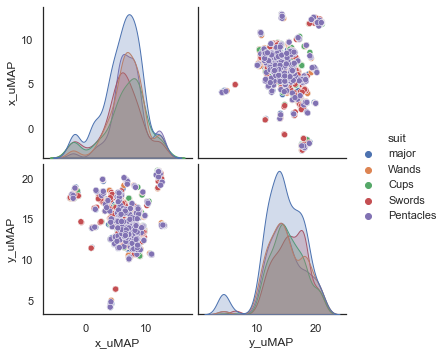

In [20]:
sns.pairplot(labyrinthos[['x_uMAP','y_uMAP','suit']], hue="suit")

# uMAP - ábrázolás

In [21]:
import altair as alt

alt.Chart(labyrinthos).mark_circle(size=60).encode(
    x='x_uMAP',
    y='y_uMAP',
    color='suit',
    tooltip=['card','suit','lem_words']
).interactive()

alt.Chart(...)